# Network Science Project 

### by Fares Ghazzawi

importing nessecary libraries

In [506]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
#from IPython import display
from IPython.display import display
import scipy
from scipy.stats import kstest
from sklearn.linear_model import LinearRegression
import requests
from typing import Dict
from networkx.algorithms import centrality
from networkx.algorithms.link_prediction import jaccard_coefficient 
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns
from networkx.algorithms import community
import itertools
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import squareform
from sklearn.cluster import AgglomerativeClustering
from IPython.display import clear_output
import operator
import random


### Data Preperation

File Friends_info.txt represent a small version of my facebook profile social Network (106 node).
The info inside the files was obtained using Selenium and chromedriver (check Scraper.ipynb)

In [457]:
#read files as DataFrames
friends = pd.read_csv("Friends_Info.txt")
relations = pd.read_csv("Edge_List.txt")

In [458]:
#convert the second column from float to int
relations = relations.astype({"Second_Node": int})
relations.dtypes

First_Node     int64
Second_Node    int32
dtype: object

brief showing of the data

In [459]:
friends.head()

,id,name,sur_name
0,0,Fayez,Ghazzawi
1,1,Dana,Ghazzawi
2,2,Iman,Mardini
3,3,Dima,Ghazzawi
4,4,Mahmoud,Ghazzawi


In [460]:
relations.head()

,First_Node,Second_Node
0,0,1
1,0,2
2,0,3
3,0,4
4,0,5


In [461]:
#creating the Graph
def create_graph_fromDF (friends , relations):
    G = nx.Graph()
    netowrk_edges =zip(relations['First_Node'],relations['Second_Node'])
    G.add_edges_from(netowrk_edges)
    nx.set_node_attributes(G,friends['name'],'friend_name')
    nx.set_node_attributes(G, friends['sur_name'],'friend_surname')
    return G

In [462]:
G = create_graph(friends , relations)

In [463]:
nx.write_gexf(G, "my_graph.gexf")

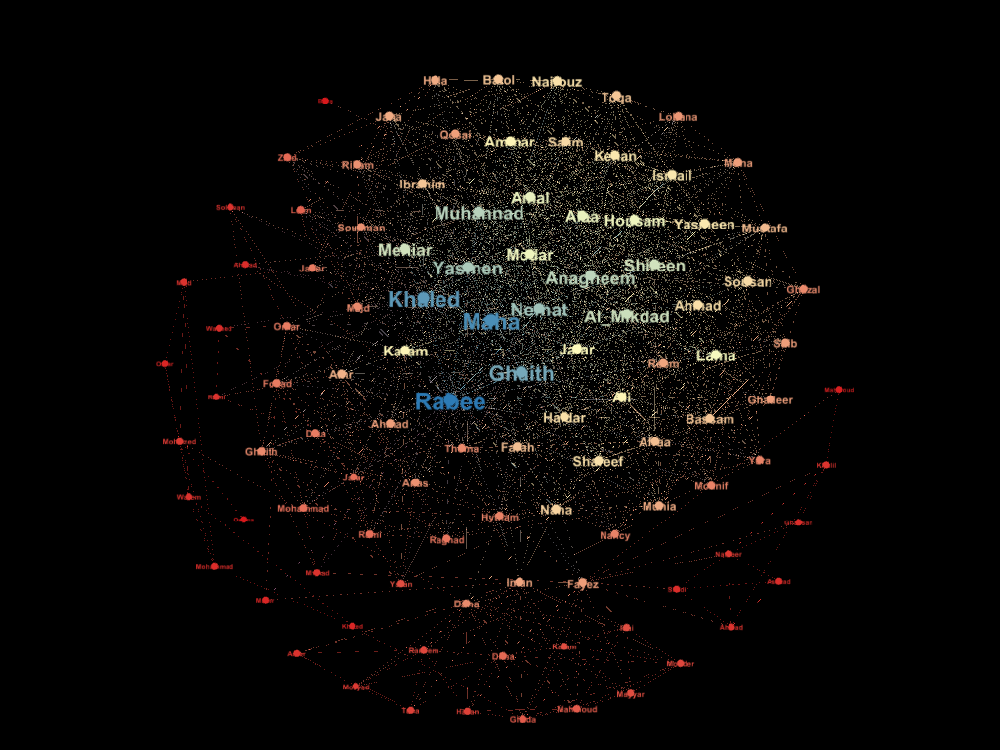

In [464]:
#graph obtaiend from gephi.exe
display.Image("Full_Graph.png")

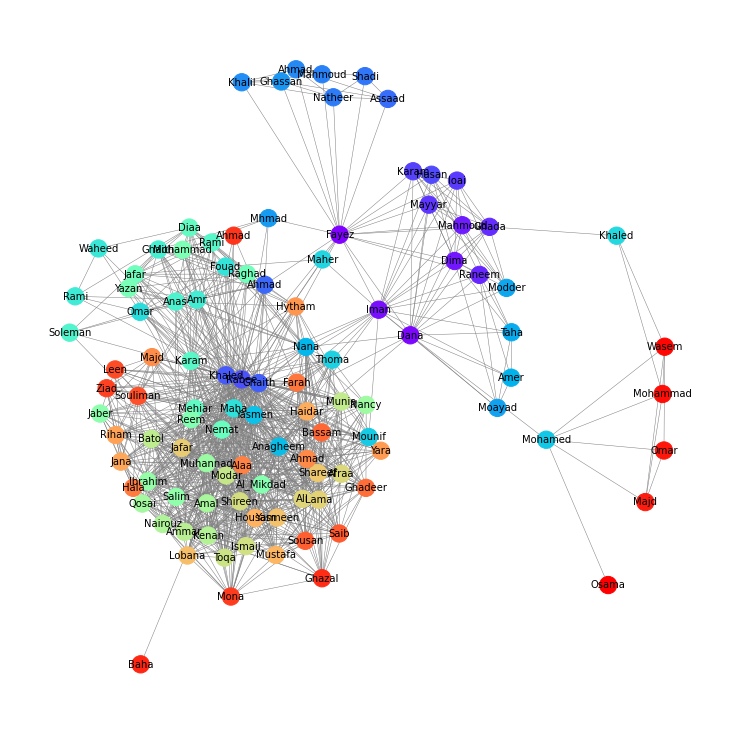

In [465]:
#you can choose any layout to display the Graph but i choose kamada_kawai becuase it is the clearest.
#pos =  nx.spiral_layout(G)
#pos = nx.circular_layout(G)
#pos =nx.random_layout(G)
#pos = nx.shell_layout(G)
#pos= nx.spring_layout(G)
pos =nx.kamada_kawai_layout(G)
plt.figure(figsize=(10, 10))
nx.draw(G,
        pos,
        node_color=range(106),
        edge_color='gray',
        width=0.5,
        node_size=300,
        labels=nx.get_node_attributes(G, 'friend_name'),
        cmap=plt.cm.rainbow,
        font_size=10)
plt.show()

so as we can see the graph is unweighted , homogeneous undirected Graph

### Basic attributes and Network summary

In [494]:
print("Number of nodes:", len(G.nodes))
print("Number of edges:", len(G.edges))
print("Diameter:", nx.diameter(G))
print("Radius:", nx.radius(G))
print("Average clustering:",nx.average_clustering(G))
print("Global clustering cofficient:", nx.transitivity(G))


Number of nodes: 106
Number of edges: 1121
Diameter: 5
Radius: 3
Average clustering: 0.685822617296087
Global clustering cofficient: 0.5862058993637941


In [468]:
#clustering coeff for each node in the Graph (local clustring)

clustring_df = pd.DataFrame(list(nx.clustering(G).items()),columns = ['id','LCC'])
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    print(clustring_df)

      id       LCC
0      0  0.255411
1      1  0.392157
2      2  0.316017
3      3  0.666667
4      4  0.781818
5      5  0.750000
6      6  0.727273
7      8  0.972222
8      9  0.972222
9     10  0.972222
10    14  0.904762
11    16  0.364803
12    25  0.385510
13    28  0.417423
14    29  0.595238
15    84  0.800000
16    85  1.000000
17    86  0.733333
18    87  1.000000
19    88  0.800000
20    89  0.600000
21    90  0.833333
22    99  0.800000
23     7  0.933333
24    11  1.000000
25    12  0.809524
26    13  1.000000
27    22  0.428571
28    48  0.573913
29    66  0.482993
30    96  0.333333
31    81  0.720588
32    98  0.784314
33   104  0.333333
34    97  0.333333
35    15  0.600000
36    17  0.405288
37    18  0.700000
38    20  0.666667
39    21  0.700000
40    24  0.528986
41    26  0.640523
42    30  0.631579
43    31  0.700000
44    33  0.769231
45    34  0.508021
46    43  0.569214
47    19  0.641667
48    23  0.496471
49    27  0.769231
50    32  0.676190
51    35  0.

Average Local clustering cofficient: 72.69719743338523


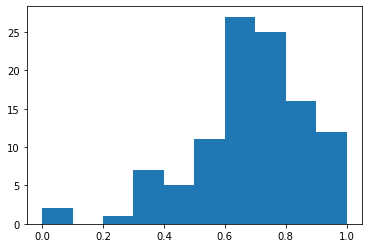

In [469]:
#average local clustering cofficient and the histogram for the above clustering coeff
cc = np.array([v for k, v in nx.clustering(G).items()])
sum_cc = np.sum(cc)
acc = np.mean(sum_cc)
print("Average Local clustering cofficient:",acc)

plt.hist(cc, bins=10)
plt.show()

In [470]:
#calculate average path length
print("Average shortest path length:",nx.average_shortest_path_length(G))

Average shortest path length: 2.2733153638814017


(array([ 6., 13., 45., 12., 11., 12.,  1.,  0.,  1.,  5.]),
 array([1.47169811, 1.6990566 , 1.92641509, 2.15377358, 2.38113208,
        2.60849057, 2.83584906, 3.06320755, 3.29056604, 3.51792453,
        3.74528302]),
 <BarContainer object of 10 artists>)

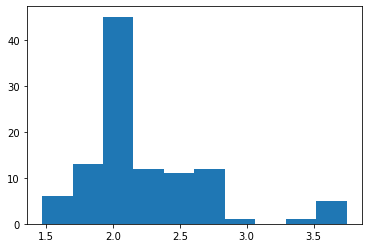

In [471]:
#histogram for shortest path length
#we will calculate the average of shortest paths between a node and all the remianing ones
pl_dic = {}
for k, v in nx.all_pairs_shortest_path_length(G):
    average_diffpaths = np.mean(list(v.values()))
    pl_dic[k]= average_diffpaths
#thus the histogram will be
plt.hist(pl_dic.values())

<BarContainer object of 71 artists>

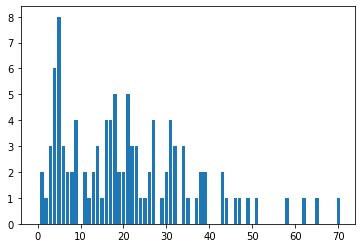

In [472]:
#degree distribution
plt.bar(range(len(nx.degree_histogram(G))),nx.degree_histogram(G))

Text(0, 0.5, 'probability')

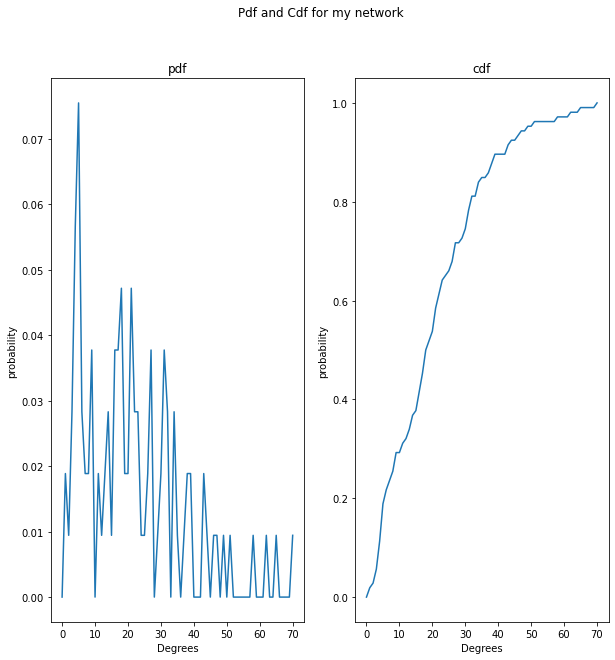

In [501]:
my_network_pdf = [deg_freq/len(G.nodes) for deg_freq in nx.degree_histogram(G)]
my_network_cdf = np.cumsum(my_network_pdf)

plt.figure(figsize=(10, 10))
plt.suptitle('Pdf and Cdf for my network')

plt.subplot(1,2,1)
plt.plot(my_network_pdf)
plt.title('pdf')
plt.xlabel('Degrees')
plt.ylabel('probability')
plt.subplot(1,2,2)
plt.plot(my_network_cdf)
plt.title('cdf')
plt.xlabel('Degrees')
plt.ylabel('probability')


we can see (from the above figuers) that our network hase power law distribution properties , since we have alot oof nodes with degree between 0-10 and very little amount of nodes that pass 50 as thier node degree

In [473]:
def power_law_pdf(x, alpha=3.5, x_min=1):
    C = (alpha - 1) / x_min ** (1 - alpha)
    return C * x ** (-alpha)

In [474]:
def power_law_cdf(x, alpha=3.5, x_min=1):
    # YOUR CODE HERE
    C = (alpha - 1) / x_min ** (1 - alpha) 
    #raise NotImplementedError()
    return 1 + (C*x**(1-alpha)/(1-alpha))

fitted model using regression and linear binning

In [475]:
def alpha_lin_bins(x_train, bins):
    # YOUR CODE HERE
    log_b = np.logspace(np.log(x_train.min()), np.log(x_train.max()), bins)
    hist, bin_edges  = np.histogram(x_train, bins=log_b, density=True)
    bin_centers = (bin_edges[1:]+bin_edges[:-1])/2
    X,Y = np.log(bin_centers[hist > 0]).reshape(-1, 1), np.log(hist[hist > 0])
    reg = LinearRegression().fit(X, Y)
    return -(reg.coef_[0])
    #raise NotImplementedError()

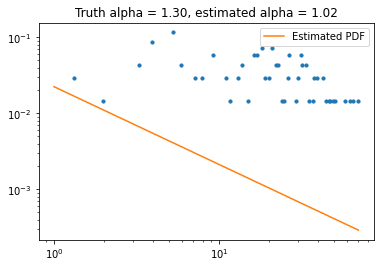

In [479]:
x_min = 1
alpha = 1.3
bins = 106

#x_train = power_law_generate(1000, alpha, x_min)
x_train = np.array(list(dict(nx.degree(G)).values()))
input_bins = np.logspace(np.log10(x_train.min()), np.log10(x_train.max()), bins)
hist, bin_edges = np.histogram(x_train, bins=bins, density=True)
bin_centers = (bin_edges[1:] + bin_edges[:-1]) / 2
plt.scatter(bin_centers, hist, s=10)

hat_alpha = alpha_lin_bins(x_train, bins)
x_space = np.linspace(x_min, x_train.max(), 100)
plt.plot(x_space, power_law_pdf(x_space, hat_alpha, x_min), 
         label='Estimated PDF', c='tab:orange')
plt.legend()
plt.title('Truth alpha = {:.2f}, estimated alpha = {:.2f}'.format(alpha, hat_alpha))
plt.xscale('log')
plt.yscale('log')
plt.show()

fitted model using MLE/kstest

In [480]:
def mle_power_law_params(degree_sequence):
    min_D = 1000
    x_min_hat= 0
    alpha_hat = 0 
    np.sort(degree_sequence)
    tmp_degree_seq = degree_sequence[:-1]
    for x_min in tmp_degree_seq:
        tmp_degree_sequence = tmp_degree_seq[tmp_degree_seq>=x_min]
        n = len(tmp_degree_sequence)
        sum_of_log = np.sum(np.log(tmp_degree_sequence/x_min))
        alpha = 1+ (n/sum_of_log)
        statistics , pvalue = kstest(tmp_degree_sequence, cdf=power_law_cdf)
        if (min_D> np.abs(statistics)):
            min_D= statistics
            x_min_hat = x_min
            alpha_hat= alpha      
    return alpha_hat,x_min_hat

C:\Users\User\AppData\Local\Temp/ipykernel_22292/3255921055.py:14: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = 1+ (n/sum_of_log)


Best Alpha: 1.362998958027091


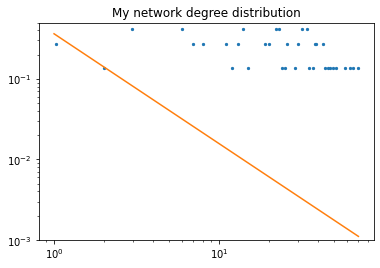

In [481]:
degree_sequence = np.array(list(dict(nx.degree(G)).values()))
hist, bin_edges = np.histogram(degree_sequence, bins=1000, density=True)
bin_centers = (bin_edges[1:] + bin_edges[:-1]) / 2
plt.scatter(bin_centers[hist > 0], hist[hist > 0], s=5)
plt.title('My network degree distribution')

hat_alpha, hat_x_min = mle_power_law_params(degree_sequence)
x_space = np.linspace(hat_x_min, degree_sequence.max(), 100)
print("Best Alpha:",hat_alpha)
plt.plot(x_space, power_law_pdf(x_space, hat_alpha, hat_x_min), 
         label='Estimated PDF', c='tab:orange')
plt.xscale('log')
plt.yscale('log')
plt.ylim(0.001, 0.5);

### Structural Analysis

ER model:

In [482]:
k_avg = sum([tupe[1] for tupe in G.degree])/len(G.nodes)

In [149]:
G_ER = nx.erdos_renyi_graph( len(G.nodes), (k_avg / (len(G.nodes)-1)))

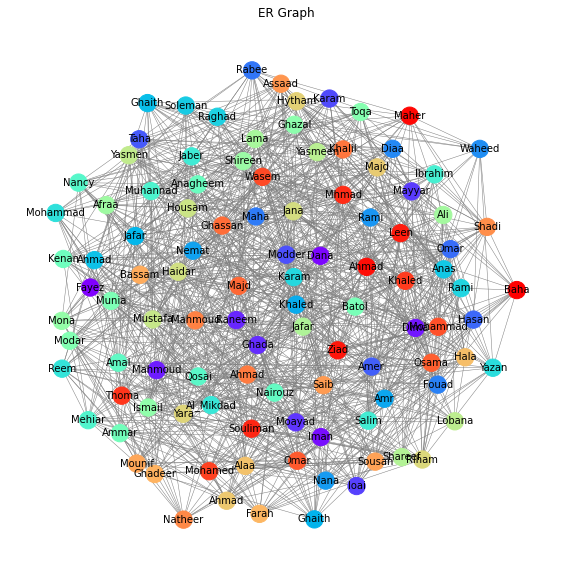

In [485]:
pos =nx.kamada_kawai_layout(G_ER)
plt.figure(figsize=(10, 10))
plt.title("ER Graph")
nx.draw(G_ER,
        pos,
        node_color=range(106),
        edge_color='gray',
        width=0.5,
        node_size=300,
        cmap=plt.cm.rainbow,
        labels=nx.get_node_attributes(G, 'friend_name'),
        font_size=10)
plt.show()

In [502]:
print("ER Graph info:")
print("Number of edges:",len(G_ER.edges))
print("Diameter:",nx.diameter(G_ER))
print("Radius:",nx.radius(G_ER))
print("Average shortest path:",nx.average_shortest_path_length(G_ER))
print("Average clustering:",nx.average_clustering(G_ER))
print("Global clustering cofficient:", nx.transitivity(G_ER))


ER Graph info:
Number of edges: 1132
Diameter: 3
Radius: 2
Average shortest path: 1.8050314465408805
Average clustering: 0.1940232071105197
Global clustering cofficient: 0.19465600673258995


BA model:

In [495]:
G_BA = nx.barabasi_albert_graph(len(G.nodes), 10)

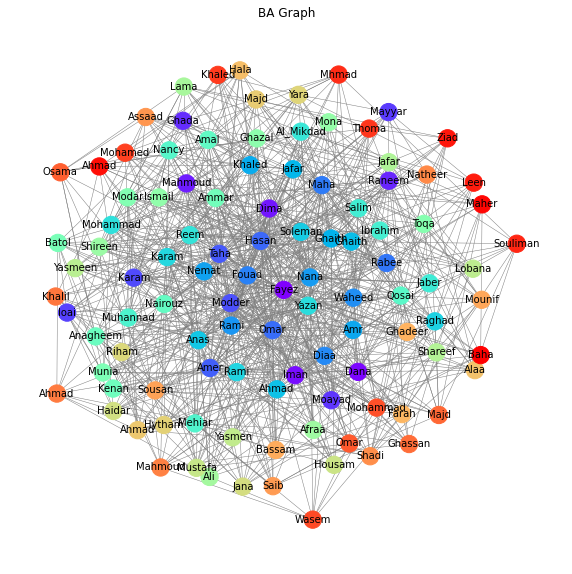

In [496]:
pos =nx.kamada_kawai_layout(G_BA)
plt.figure(figsize=(10, 10))
plt.title("BA Graph")
nx.draw(G_BA,
        pos,
        node_color=range(106),
        edge_color='gray',
        width=0.5,
        node_size=300,
        cmap=plt.cm.rainbow,
        labels=nx.get_node_attributes(G, 'friend_name'),
        font_size=10)
plt.show()

In [503]:
print("BA Graph info:")
print("Number of edges:",len(G_BA.edges))
print("Diameter:",nx.diameter(G_BA))
print("Radius:",nx.radius(G_BA))
print("Average shortest path:",nx.average_shortest_path_length(G_BA))
print("Average clustering:",nx.average_clustering(G_BA))
print("Global clustering cofficient:", nx.transitivity(G_BA))


BA Graph info:
Number of edges: 960
Diameter: 3
Radius: 2
Average shortest path: 1.8774483378256963
Average clustering: 0.26868239535050514
Global clustering cofficient: 0.25286761940579167


WS model:

In [490]:
G_WS= nx.watts_strogatz_graph(len(G.nodes), 10,0.5)

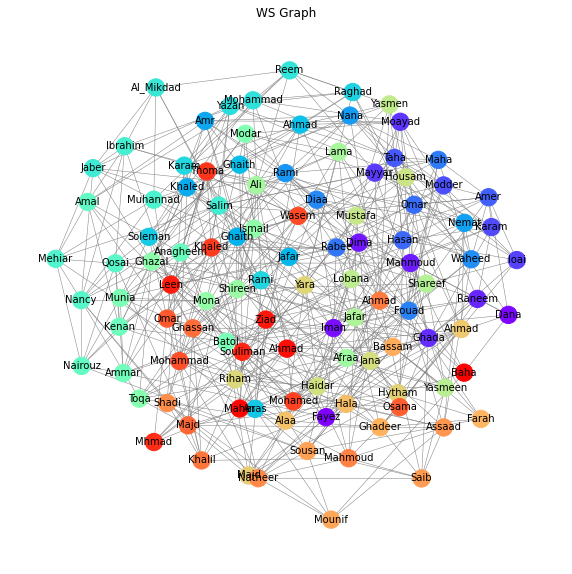

In [491]:
pos =nx.kamada_kawai_layout(G_WS)
plt.figure(figsize=(10, 10))
plt.title("WS Graph")
nx.draw(G_WS,
        pos,
        node_color=range(106),
        edge_color='gray',
        width=0.5,
        node_size=300,
        cmap=plt.cm.rainbow,
        labels=nx.get_node_attributes(G, 'friend_name'),
        font_size=10)
plt.show()

In [504]:
print("GS Graph info:")
print("Number of edges:",len(G_WS.edges))
print("Diameter:",nx.diameter(G_WS))
print("Radius:",nx.radius(G_WS))
print("Average shortest path:",nx.average_shortest_path_length(G_WS))
print("Average clustering:",nx.average_clustering(G_WS))
print("Global clustering cofficient:", nx.transitivity(G_WS))


GS Graph info:
Number of edges: 530
Diameter: 4
Radius: 3
Average shortest path: 2.2968553459119496
Average clustering: 0.13920199297557778
Global clustering cofficient: 0.13399353274050121


Comparing degree distribution between Graphs

<BarContainer object of 45 artists>

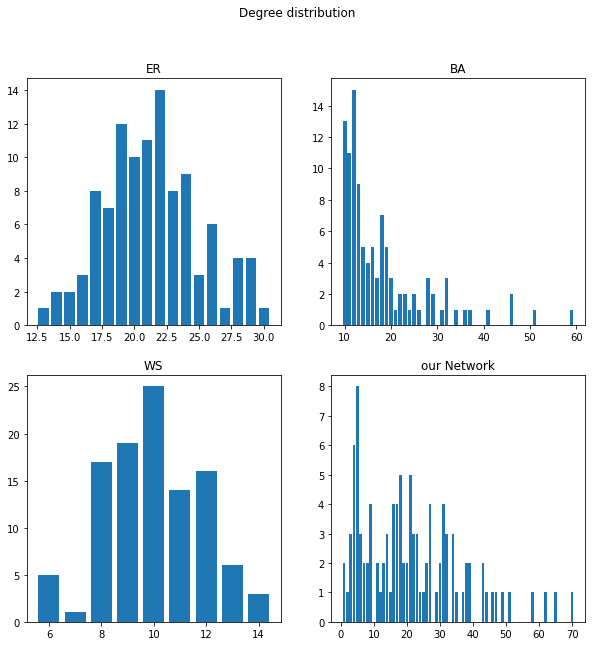

In [498]:
plt.figure(figsize=(10, 10))
plt.suptitle('Degree distribution')
plt.subplot(2,2,1)
plt.title('ER')
degree_seq = [degree for (node, degree) in G_ER.degree]
bins, freq = np.unique(degree_seq, return_counts=True)
plt.bar(bins, freq)
plt.subplot(2,2,2)
plt.title('BA')
degree_seq = [degree for (node, degree) in G_BA.degree]
bins, freq = np.unique(degree_seq, return_counts=True)
plt.bar(bins, freq)
plt.subplot(2,2,3)
plt.title('WS')
degree_seq = [degree for (node, degree) in G_WS.degree]
bins, freq = np.unique(degree_seq, return_counts=True)
plt.bar(bins, freq)
plt.subplot(2,2,4)
plt.title('our Network')
degree_seq = [degree for (node, degree) in G.degree]
bins, freq = np.unique(degree_seq, return_counts=True)
plt.bar(bins, freq)


out of the three models that been discribed above (ER ,BA, GS), we have found that BA with m = 10 is the closest to our network.

we can see that ER model does not satisfy power law property (from degree distribution above).

BA gives as power law-like distribution which is very good 

WS gives as more of a poisson distribution which is rather different than our own network distribution

The closest value for Global clustering cofficients from the above models is the one for BA model , but it is still ,aproximatly, equals have the value for Global clustering cofficients of our network

we know that all the models above satisfies small world property but WS model got the higher Average shortest path value and the closest to our network, but keep in mind that BA model also got relativly close Average shortest path value to our network

###### real world network properties 

In [182]:
url = 'https://raw.githubusercontent.com/network-science-course/network-science-course/main/datasets/wiki_vote.txt'
open('wiki_vote.txt', 'wb').write(requests.get(url).content)

url = 'https://raw.githubusercontent.com/network-science-course/network-science-course/main/datasets/facebook_combined.txt'
open('facebook_combined.txt', 'wb').write(requests.get(url).content)

url = 'https://raw.githubusercontent.com/network-science-course/network-science-course/main/datasets/collaboration_network_of_arxiv_general_relativity_category.txt'
open('collaboration_network_of_arxiv_general_relativity_category.txt', 'wb').write(requests.get(url).content);

files = [['Wikipedia votes', 'wiki_vote.txt'], 
         ['Collaboration network', 'collaboration_network_of_arxiv_general_relativity_category.txt'], 
         ['Facebook', 'facebook_combined.txt']]

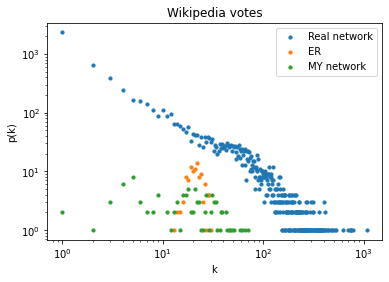

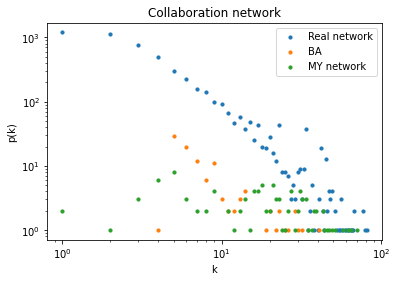

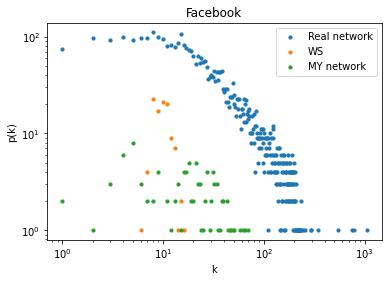

In [184]:
random_Graphs = [G_ER , G_BA, G_WS]
i=0
name = ""
for graph in random_Graphs: 
    real_net = nx.read_edgelist(files[i][1])  
    degree_hist = np.array(nx.degree_histogram(real_net))
    idx = np.argwhere(degree_hist > 0)
    plt.scatter(idx, degree_hist[idx], s=10, label='Real network')
    degree_hist = np.array(nx.degree_histogram(graph))
    idx = np.argwhere(degree_hist > 0)
    if (i == 0):
        name= "ER"
    elif (i ==1):
        name = "BA"
    else:
        name = "WS"
    plt.scatter(idx, degree_hist[idx], s=10, label=name)
    degree_hist = np.array(nx.degree_histogram(G))
    idx = np.argwhere(degree_hist > 0)
    plt.scatter(idx, degree_hist[idx], s=10, label='MY network')
    plt.legend()
    plt.xlabel('k')
    plt.ylabel('p(k)')
    plt.title(graph.name)
    plt.xscale('log')
    plt.yscale('log')
    plt.title(files[i][0])
    plt.show()
    i+=1


#### Centralities

In [507]:
def centralities(G: nx.Graph) -> Dict[str, pd.DataFrame]:

    output_dic = {}
    info_dic ={}
    #degree_centrality
    degree_dic = centrality.degree_centrality(G)
    degree=np.array(list(degree_dic.values()))
    items = degree_dic.items()
    degree_list = sorted(list(items),key = lambda x:x[1],reverse = True)
    ids, c= zip(*degree_list)
    names = [nx.get_node_attributes(G,'friend_name')[i] for i in ids]
    surnames = [nx.get_node_attributes(G,'friend_surname')[i] for i in ids]
    output_dic['degree'] = pd.DataFrame({"name": names, "surname": surnames,"centrality": c})
    #closeness_centrality
    closeness_dic = centrality.closeness_centrality(G)
    closness=np.array(list(closeness_dic.values()))
    items = closeness_dic.items()
    closeness_list = sorted(list(items),key = lambda x:x[1],reverse = True)
    ids, c= zip(*closeness_list)
    names = [nx.get_node_attributes(G,'friend_name')[i] for i in ids]
    surnames = [nx.get_node_attributes(G,'friend_surname')[i] for i in ids]
    output_dic['closeness'] = pd.DataFrame({"name": names, "surname": surnames,"centrality": c})
    #betweenness_centrality
    betweenness_dic = centrality.betweenness_centrality(G)
    betwesness=np.array(list(betweenness_dic.values()))
    items = betweenness_dic.items()
    betweenness_list = sorted(list(items),key = lambda x:x[1],reverse = True)
    ids, c= zip(*betweenness_list)
    names = [nx.get_node_attributes(G,'friend_name')[i] for i in ids]
    surnames = [nx.get_node_attributes(G,'friend_surname')[i] for i in ids]
    output_dic['betweenness'] = pd.DataFrame({"name": names, "surname": surnames,"centrality": c})
    #EigenVector_centrality
    eigenvector_dic = centrality.eigenvector_centrality(G)
    eigenvector=np.array(list(eigenvector_dic.values()))
    items = eigenvector_dic.items()
    eigenvector_list = sorted(list(items),key = lambda x:x[1],reverse = True)
    ids, c= zip(*eigenvector_list)
    names = [nx.get_node_attributes(G,'friend_name')[i] for i in ids]
    surnames = [nx.get_node_attributes(G,'friend_surname')[i] for i in ids]
    output_dic['eigenvector'] = pd.DataFrame({"name": names, "surname": surnames,"centrality": c})
    #katz_centrality
    katz_dic = centrality.katz_centrality_numpy(G, alpha = 0.1)
    katz=np.array(list(katz_dic.values()))
    items = katz_dic.items()
    katz_list = sorted(list(items),key = lambda x:x[1],reverse = True)
    ids, c= zip(*katz_list)
    names = [nx.get_node_attributes(G,'friend_name')[i] for i in ids]
    surnames = [nx.get_node_attributes(G,'friend_surname')[i] for i in ids]
    
    output_dic['`'] = pd.DataFrame({"name": names, "surname": surnames,"centrality": c})
    dict_info={'degree':degree,'closeness':closness,'betweenness':betwesness, 'eigenvector':eigenvector ,'katz': katz}
    
    return output_dic ,dict_info
    # YOUR CODE HERE
    #raise NotImplementedError()

Degree centrality


,name,surname,centrality
0,Rabee,AlFazaa,0.666667
1,Maha,Quarqout,0.619048
2,Khaled,Ali_Deeb,0.590476
3,Ghaith,Abtah,0.552381
4,Nemat,Aloush,0.485714
...,...,...,...
101,Khaled,Badwan,0.028571
102,Omar,Hamid,0.028571
103,Mahmoud,Abu_Zahra,0.019048
104,Baha,Mualla,0.009524


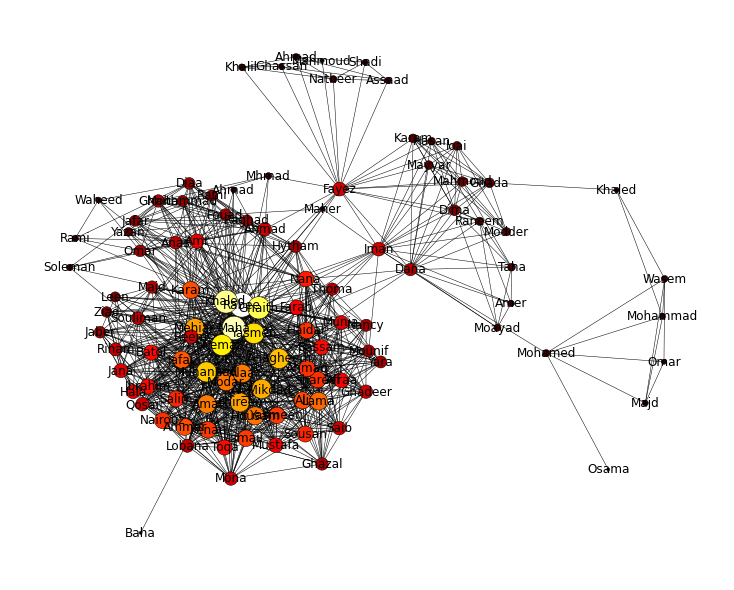

Closeness centrality


,name,surname,centrality
0,Rabee,AlFazaa,0.673077
1,Khaled,Ali_Deeb,0.656250
2,Ghaith,Abtah,0.640244
3,Yasmen,Al-shelle,0.603448
4,Anagheem,Ibrahim,0.593220
...,...,...,...
101,Wasem,Badwan,0.268542
102,Mohammad,Badwan,0.267857
103,Majd,Abo_Khamis,0.267176
104,Omar,Hamid,0.266497


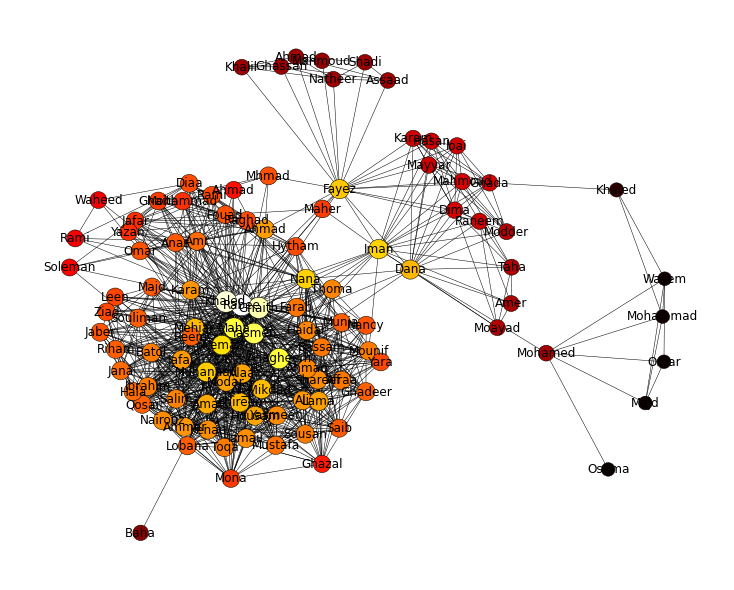

Betweenness centrality


,name,surname,centrality
0,Fayez,Ghazzawi,0.178574
1,Dana,Ghazzawi,0.146404
2,Khaled,Ali_Deeb,0.125758
3,Rabee,AlFazaa,0.113442
4,Iman,Mardini,0.108388
...,...,...,...
101,Amer,Mardini,0.000000
102,Ahmad,Hmoo_Haidar,0.000000
103,Baha,Mualla,0.000000
104,Omar,Hamid,0.000000


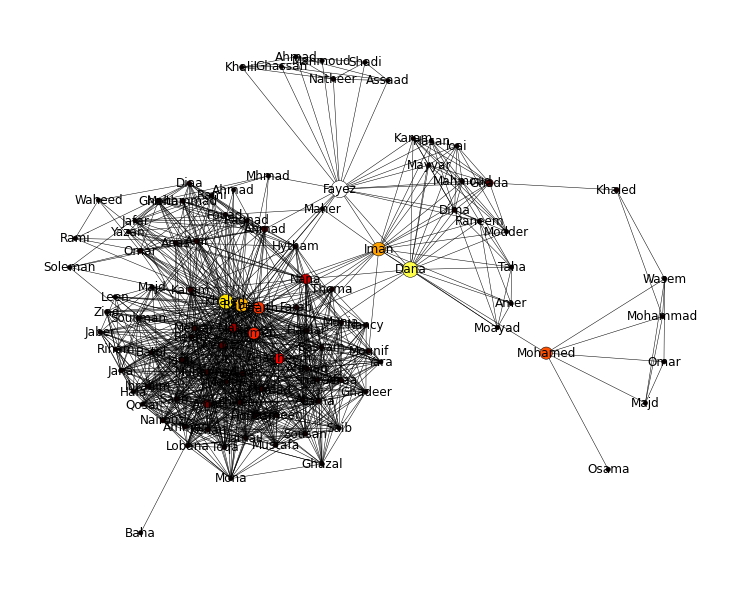

Eigenvector centrality


,name,surname,centrality
0,Rabee,AlFazaa,0.218120
1,Maha,Quarqout,0.214708
2,Khaled,Ali_Deeb,0.199409
3,Ghaith,Abtah,0.194195
4,Nemat,Aloush,0.185640
...,...,...,...
101,Wasem,Badwan,0.000018
102,Mohammad,Badwan,0.000017
103,Majd,Abo_Khamis,0.000015
104,Omar,Hamid,0.000015


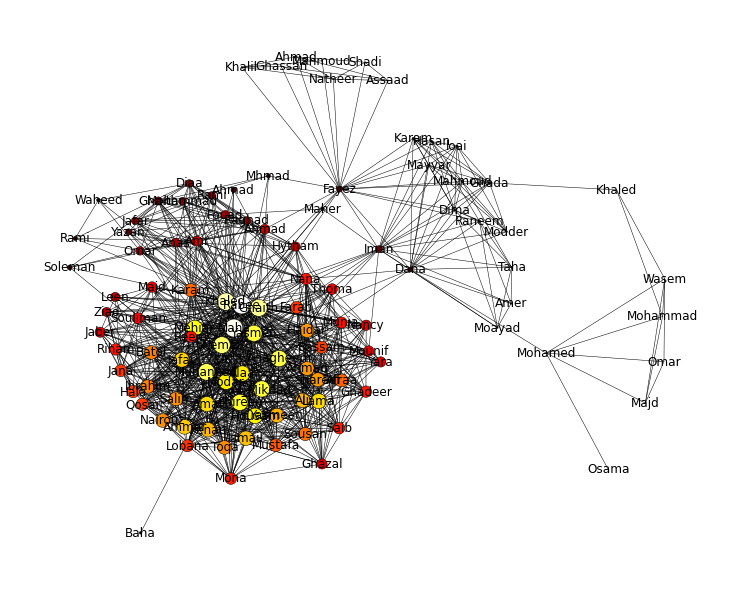

Katz centrality


,name,surname,centrality
0,Iman,Mardini,0.341091
1,Dana,Ghazzawi,0.330348
2,Dima,Ghazzawi,0.306558
3,Fayez,Ghazzawi,0.294508
4,Mahmoud,Ghazzawi,0.277833
...,...,...,...
101,Lama,Bou_Issa,-0.050630
102,Saib,Shaddod,-0.053965
103,Ghadeer,Andraous,-0.056286
104,Bassam,Barakat,-0.071121


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:1003: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


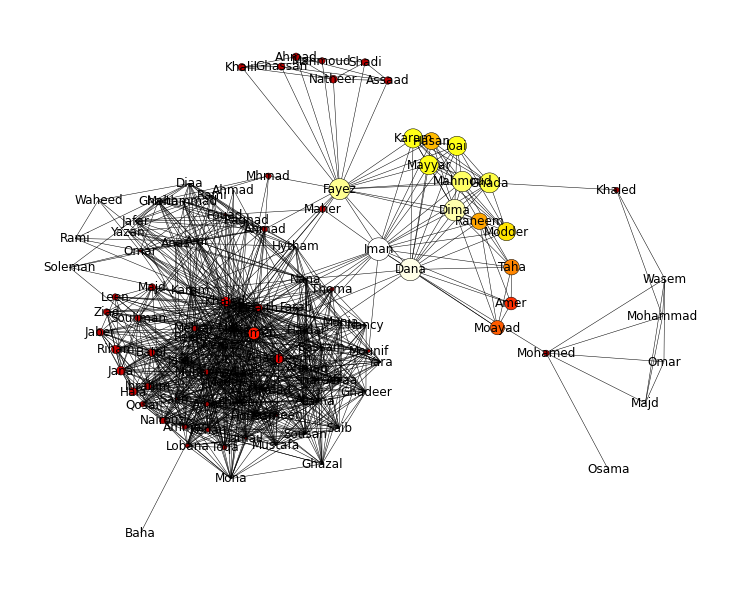

In [517]:
central ,central_values = centralities(G)
cases = [['degree', 900, 0, 'Degree centrality'], 
         ['closeness', 700, 0, 'Closeness centrality'], 
         ['betweenness', 1500, 20, 'Betweenness centrality'],
         ['eigenvector', 1500, 0, 'Eigenvector centrality'],
         ['katz', 1500, 0,'Katz centrality']
        ]
pos =nx.kamada_kawai_layout(G)
for c_key, scale, bias, title in cases:
    print(title)
    display(central[c_key])
    plt.figure(figsize=(10, 8))
    nx.draw(G, 
            pos,
            width=0.5,
            linewidths=0.5,
            edgecolors='black',
            cmap=plt.cm.hot,
            labels=nx.get_node_attributes(G, 'friend_name'),
            node_size=central_values[c_key]*scale + bias,
            node_color=central_values[c_key])
    plt.show()

my social network is devided into multiple basic categories:
* Family : which contains my close family members (mother ,father , siblings) and far family members (cousins , uncles , aunts)
* Middle School Friends (keep in mind that me and my little sister attended the same middle school for one year)
* Neighborhood friends (keep in mind that my brother also know them)
* High school friends: which was a private school called "national center of distinugeshed" (contatins overall 225 students so most students knew eachother)
* University friends
* People i met in Moscow 

in case of Degree centrality: top 5 answers are my friends who studied with me in both high school and in university, thus they know people from both catigouries and thus they have a bigger degree centrality

in case of Degree centrality: top 5 answers are my friends who are more socially active , thus they know alot of people making distance between them and any other friend is realtivly low thus higher closeness centrality value

in case of betweenness centrality: my brother got the highest value since he connects my neighborhood friends with the rest of the Graph (lots of shortest paths going through the node).

my sister is second becuase she connects my middle school friends with the rest of the graph

pay attention that my mom also appears in number 5 spot since she knows alot of my friends throughout my period of study

in case of Eigenvector centrality we get a relativley close top five for the ones in degree centrality , and we can explain that those friends are important in the graph since they are connected to each other and connected to multiple other nodes (based on the concept that eigenvector centrality presents which is "the importance of a node depends on the importance of its neighbors")

##### PageRank values for the Graph 

it is not very meaning full since the Graph is not directed , but pagerank function will convert our graph into directed graph

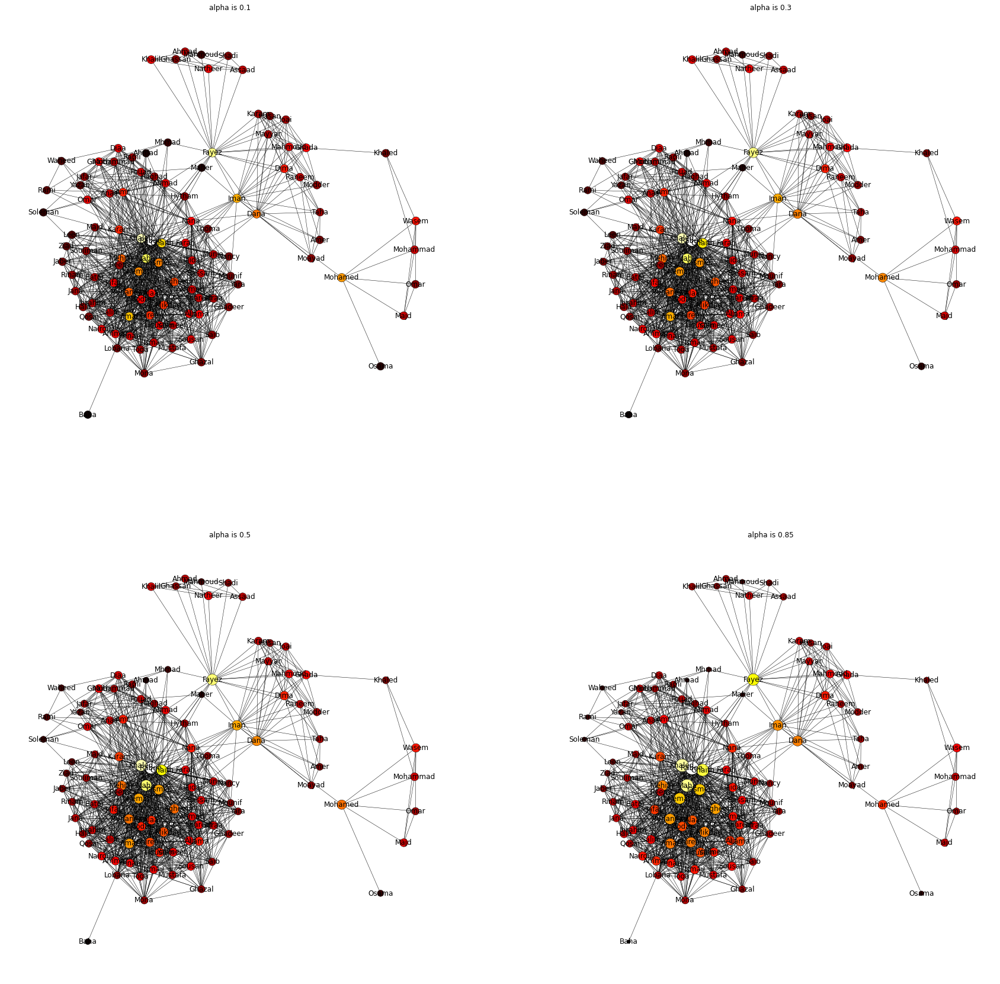

In [241]:
plt.figure(figsize=(30, 30))
alphas = [0.1 , 0.3 , 0.5 , 0.85]
pos =nx.kamada_kawai_layout(G)
for index , alpha  in enumerate(alphas):
    plt.subplot(2, 2, index+1)
    PR = np.array(list(nx.pagerank(G, alpha= alpha).values()))
    nx.draw(G, 
            pos,
            width=0.5,
            linewidths=0.5,
            edgecolors='black',
            cmap=plt.cm.hot,
            labels=nx.get_node_attributes(G, 'friend_name'),
            node_size=PR *2e4 ,
            node_color=PR)
    plt.title('alpha is {}'.format(alpha))
    #plt.show()

In [240]:
alphas = [0.1 , 0.3 , 0.5 , 0.85]
for alpha  in alphas:
    pageranker_dic = nx.pagerank(G, alpha)
    items = pageranker_dic.items()
    pageranker_list = sorted(list(items),key = lambda x:x[1],reverse = True)
    ids, c= zip(*pageranker_list)
    names = [nx.get_node_attributes(G,'friend_name')[i] for i in ids]
    surnames = [nx.get_node_attributes(G,'friend_surname')[i] for i in ids]
    pageranker = pd.DataFrame({"name": names, "surname": surnames,"PageRank score": c}) 
    print('alpha is {}'.format(alpha))
    display(pageranker)

alpha is 0.1


,name,surname,PageRank score
0,Rabee,AlFazaa,0.011669
1,Khaled,Ali_Deeb,0.011438
2,Fayez,Ghazzawi,0.011284
3,Maha,Quarqout,0.011144
4,Ghaith,Abtah,0.010688
...,...,...,...
101,Soleman,Yousef,0.008690
102,Osama,Ismaeil,0.008664
103,Maher,Al_Fazaa,0.008614
104,Ahmad,Hmoo_Haidar,0.008586


alpha is 0.3


,name,surname,PageRank score
0,Rabee,AlFazaa,0.015788
1,Khaled,Ali_Deeb,0.015101
2,Fayez,Ghazzawi,0.014627
3,Maha,Quarqout,0.014351
4,Ghaith,Abtah,0.013222
...,...,...,...
101,Soleman,Yousef,0.007235
102,Osama,Ismaeil,0.007195
103,Maher,Al_Fazaa,0.007012
104,Ahmad,Hmoo_Haidar,0.006934


alpha is 0.5


,name,surname,PageRank score
0,Rabee,AlFazaa,0.019482
1,Khaled,Ali_Deeb,0.018307
2,Fayez,Ghazzawi,0.017431
3,Maha,Quarqout,0.017322
4,Ghaith,Abtah,0.015802
...,...,...,...
101,Soleman,Yousef,0.005797
102,Osama,Ismaeil,0.005775
103,Maher,Al_Fazaa,0.005447
104,Ahmad,Hmoo_Haidar,0.005330


alpha is 0.85


,name,surname,PageRank score
0,Rabee,AlFazaa,0.025361
1,Khaled,Ali_Deeb,0.023040
2,Maha,Quarqout,0.022574
3,Ghaith,Abtah,0.020757
4,Fayez,Ghazzawi,0.019385
...,...,...,...
101,Waheed,Al_Homse,0.003162
102,Osama,Ismaeil,0.003102
103,Maher,Al_Fazaa,0.002715
104,Ahmad,Hmoo_Haidar,0.002641


with diffrent values for the damping parameter alpha we can observe that the top 5 answers remains the same based on thier position and connections in the Graph as explaiend above

###### HITS

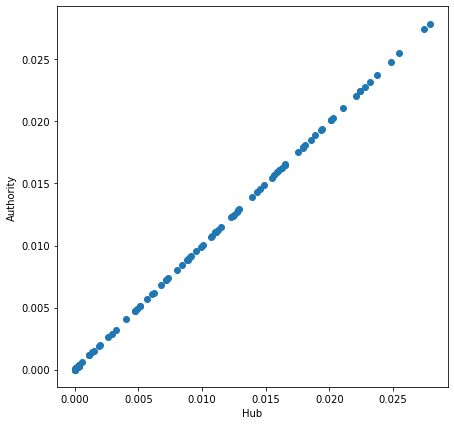

In [242]:
hub, auth = nx.hits(G)
plt.figure(figsize=(7, 7))
plt.scatter(hub.values(), auth.values())
plt.xlabel('Hub')
plt.ylabel('Authority')
plt.show()

###### Assortative mixing 

we did not make assortative mixing since our data does not contain other features (than name and sur_name)

###### Node structural equivalence/similarity.

In [244]:
def sim_matrices(G):
    A = nx.to_numpy_array(G)
    Pr = np.corrcoef(A)
    Js = np.zeros(Pr.shape)
    tuple_j = jaccard_coefficient (G)
    for u,v,p in tuple_j:
      Js[u,v] = p
      Js[v,u] = p
    for i in range(0,106):
      Js[i,i] =1
    Cos = cosine_similarity(A)
    return A , Pr,Js,Cos

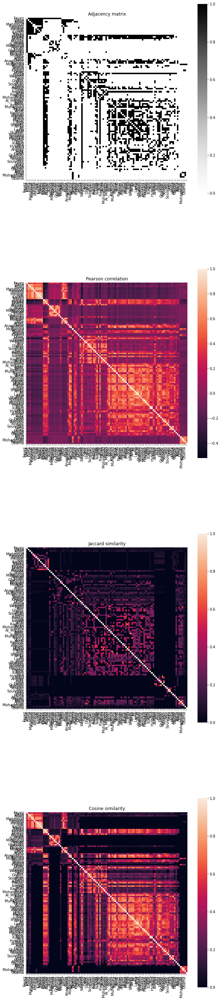

In [275]:
A, corr, J, cos = sim_matrices(G)
labs = nx.get_node_attributes(G, "friend_name")
labs = {i:labs[i][:15] if len(labs[i])<=15 else labs[i][:15] + '...' for i in labs}

fig = plt.figure(figsize=(10, 50))
plt.subplots_adjust(hspace=0.4, wspace=0.4)
cases = [[1, A, plt.cm.Greys, 'Adjacency matrix'], 
         [2, corr, None, 'Pearson correlation'], 
         [3, J, None, 'Jaccard similarity'], 
         [4, cos, None, 'Cosine similarity'], ]
r , c = matrix.shape
#yticks = np.linspace(0, r - 1, 106, dtype=int)
xticks = np.linspace(0, c - 1, 106, dtype=int)
for i, matrix, cmap, t in cases:
    plt.subplot(4, 1, i)
    hmap = sns.heatmap(
        matrix,
        cmap=cmap,
        square=True,
        yticklabels=[labs.get(i) for i in G.nodes])
    #hmap.set_yticks(yticks)
    hmap.set_xticks(xticks)
    hmap.set_xticklabels(
        labels=[labs.get(i) for i in G.nodes], 
        horizontalalignment='right')
    plt.title(t)

In [518]:

labs = nx.get_node_attributes(G, "friend_name")


#### Community Detection 

##### k-cores visualization

The following code will display the maximum subgraph that contains nodes of degree k or more (where k takes integer values from the interval [1,20])

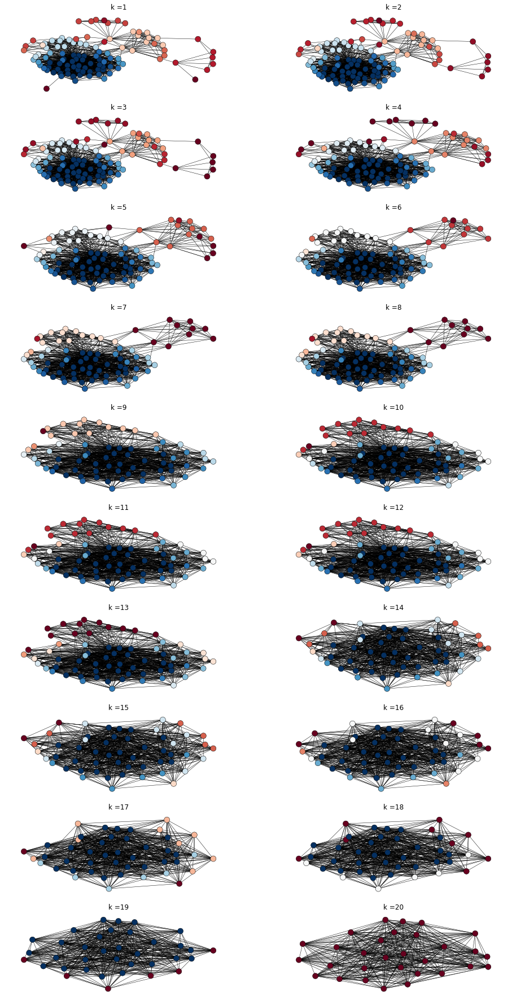

In [291]:
labels = np.array(list(nx.core_number(G).values()))
plt.figure(figsize=(8*2, 8*4))
pos = nx.kamada_kawai_layout(G)

for k in range(20):
    plt.subplot(10, 2, k+1)
    subG = nx.k_core(G, k+1)
    nx.draw(subG, 
            pos,
            width=0.5,
            linewidths=0.5,
            edgecolors='black',
            cmap=plt.cm.RdBu,
            node_size=100 ,
            node_color=np.array(list(nx.core_number(subG).values())))
    plt.axis('off')
    plt.title('k ={}'.format(k+1))

##### Clique Search

The following cells will display the largest complete subgraph in our network based on clique search algorithm

In [327]:
def max_cliques(G):
    cliques=list(nx.find_cliques(G))
    cliques.sort(key=len , reverse=True)
    max_cliques = []
    max_cliques_names = []
    names = nx.get_node_attributes(G, 'friend_name')
    max_cliques.append(cliques[0])
    w_color=[1,1,1]
    r_color = [1,0,0]
    color=[]
    nodes_color=[]
    for i in range(1,len(cliques)):
        if len(cliques[0])==len(cliques[i]):
            max_cliques.append(cliques[i])
    for i in range(0,len(max_cliques)): 
        tmp_cliques_names= []
        for node in G.nodes:
            if node in max_cliques[i]:
                color.append(r_color)
                tmp_cliques_names.append(names[node])
            else:
                color.append(w_color)
        nodes_color.append(color.copy())
        max_cliques_names.append(tmp_cliques_names.copy())
        tmp_cliques_names.clear()
        color.clear()
    return np.array(nodes_color), np.array(max_cliques_names)

the 1-th clique contains these nodes 
 ['Rabee' 'Khaled' 'Ghaith' 'Anagheem' 'Yasmen' 'Maha' 'Mehiar' 'Nemat'
 'Al_Mikdad' 'Muhannad' 'Modar' 'Shireen' 'Ali' 'Lama' 'Jafar' 'Shareef'
 'Housam' 'Haidar']
the 2-th clique contains these nodes 
 ['Rabee' 'Khaled' 'Ghaith' 'Anagheem' 'Yasmen' 'Maha' 'Mehiar' 'Nemat'
 'Al_Mikdad' 'Muhannad' 'Amal' 'Modar' 'Shireen' 'Ali' 'Lama' 'Jafar'
 'Shareef' 'Housam']


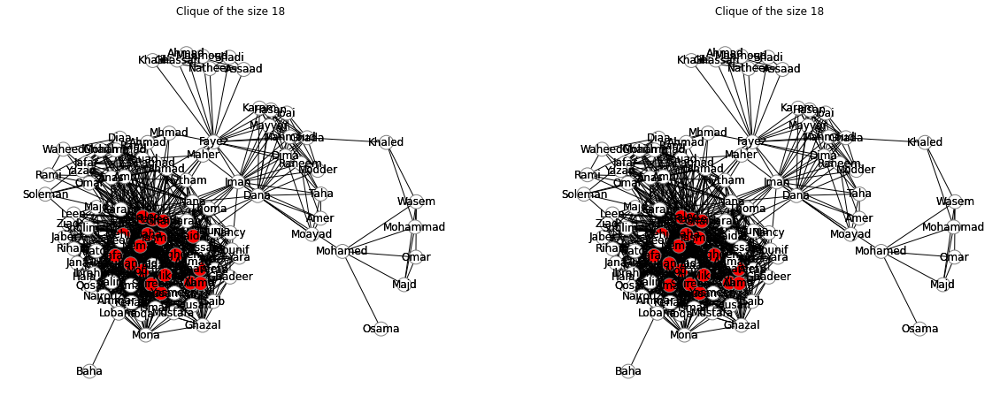

In [328]:
#2 max cliques in our case 
colors , max_cliques = max_cliques(G)
for i in range(0,len(max_cliques)):
    print ("the {}-th clique contains these nodes \n {}".format(i+1,max_cliques[i]))
#number of elements in the biggest cliques
size = np.unique(colors[0], axis=0, return_counts=True)[1][0]
plt.figure(figsize=(20, 8))
pos = nx.kamada_kawai_layout(G)
labels = nx.get_node_attributes(G,"friend_name")
for i in range(colors.shape[0]):
    plt.subplot(1, 2, i+1)
    nx.draw(G, 
            pos,
            edgecolors='gray',
            labels=nx.get_node_attributes(G, 'friend_name'),
            node_size=250 ,
            node_color=colors[i])
    nx.draw_networkx_labels(G,pos,labs)
    plt.title('Clique of the size {}'.format(size))
    plt.axis('off')

we can see that the largest complete subgraph in both cases (we have 2 cases in our network as explaiend above) contains my colleagues from highschool(since as i explained there was a really small number of students and mostly everyone knew each other)

##### Grivan_newman community detection Algo

In [340]:
def edge_betweenness(G, n):
    comp = community.girvan_newman(G)
    labels = np.zeros((n,len(G.nodes)))
    row = 0
    for communities in itertools.islice(comp, n):
        int_label = 1
        for c in communities:
            for node in sorted(c):
                labels[row][node] = int_label
            int_label = int_label + 1
        row = row +1 
    return labels

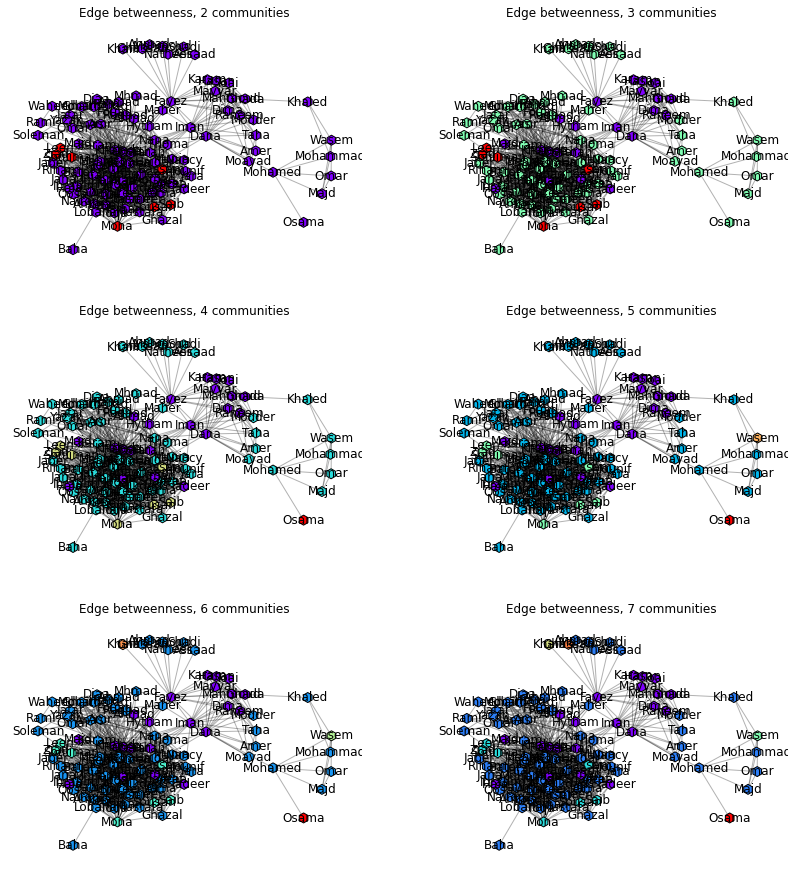

In [342]:

plt.figure(figsize=(7*2, 7*3))
colors = edge_betweenness(G,6)
pos = nx.kamada_kawai_layout(G)
labels = nx.get_node_attributes(G,"friend_name")
for i in range(0,len(list(colors))):
    plt.subplot(4, 2, i+1)
    nx.draw_networkx_nodes(
        G, 
        pos,
        cmap=plt.cm.rainbow,
        node_color=colors[i], 
        node_size=100, 
        node_shape= 'h',
        edgecolors='black',
      
    )
    nx.draw_networkx_edges(G, pos, alpha=0.3)
    nx.draw_networkx_labels(G,pos,labels)
    plt.title('Edge betweenness, {} communities'.format(i+2))
    plt.axis('off')

we can see that the algorithm does not work will in our graph since it depends on betweeness of edges, for example: in 4 communites case , we observe that the algorithm will but 'Osama' (who is a brother of my middle school best friend) in a seperate class since his edge has a high betweeness centerality. but actuallly he is not in a seperate cluster.

##### Agglomerative clustering

In [403]:
def simrank_distance(G):
    i_matrix = np.ones((106,106))
    simRank_matrix = nx.simrank_similarity_numpy(G)
    distance_matrix = i_matrix - simRank_matrix
    distance_matrix = np.round(distance_matrix , decimals = 8)
    return distance_matrix

C:\Users\User\AppData\Local\Temp/ipykernel_22292/146407595.py:3: DeprecationWarning: networkx.simrank_similarity_numpy is deprecated and will be removedin NetworkX 3.0, use networkx.simrank_similarity instead.
  simRank_matrix = nx.simrank_similarity_numpy(G)


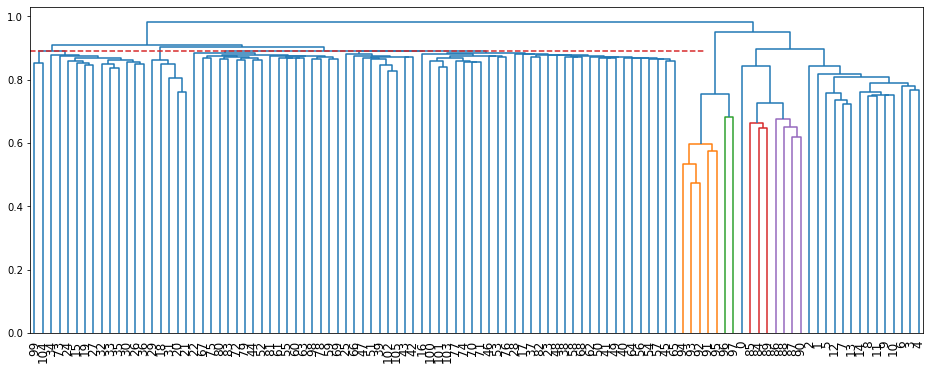

In [404]:
distance = simrank_distance(G)
plt.figure(figsize=(16, 6))
linked = linkage(squareform(distance), 'complete')
dendrogram(linked, labels=list(G.nodes), 
           leaf_font_size=12)
plt.plot([0, 800], [0.89, 0.89], linestyle='--', c='tab:red')
plt.show()

we use the plot above to get the value 0.89 for distance threshold since we don't want a huge amount of clusters

In [405]:
from networkx.algorithms.cluster import clustering
def agglomerative_clustering(distance, max_distance):
    clustring = AgglomerativeClustering(n_clusters = None , affinity = 'precomputed',linkage = 'complete' , distance_threshold = max_distance, compute_full_tree=True).fit(distance)
    return clustring.labels_
    # YOUR CODE HERE
    #raise NotImplementedError()

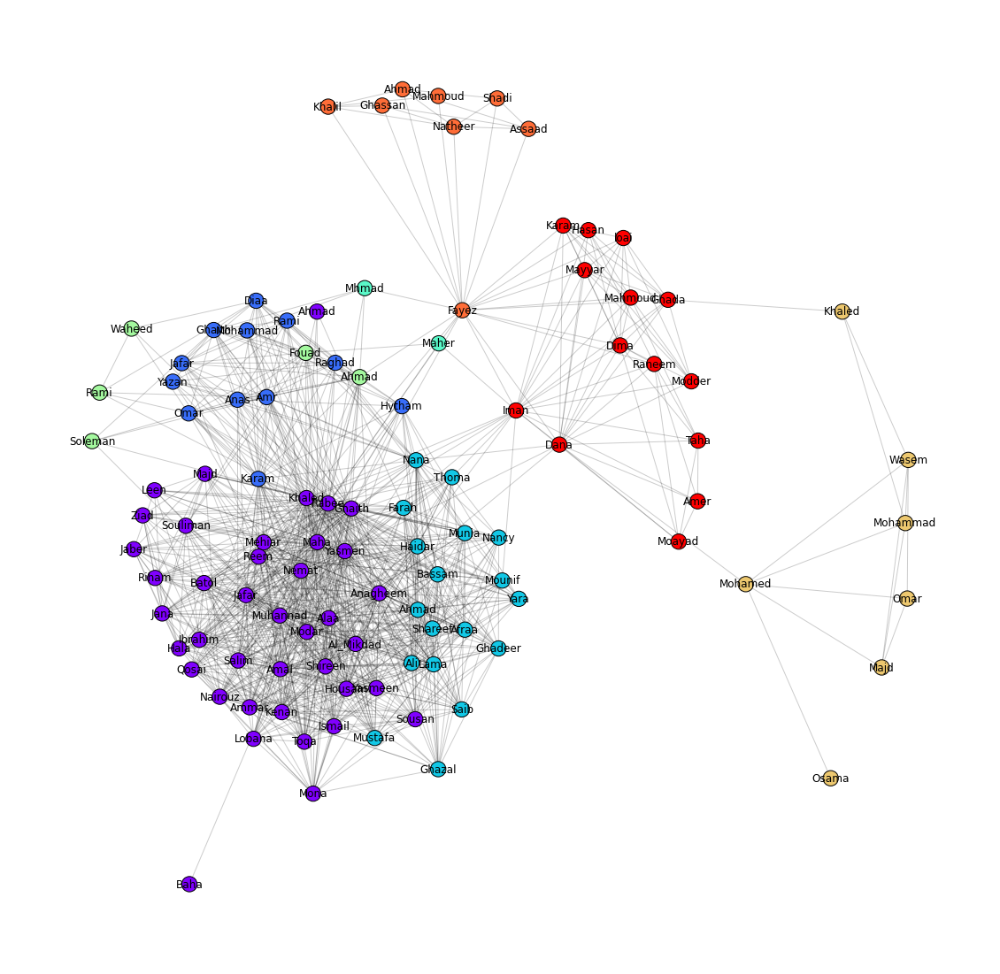

In [513]:
labels = agglomerative_clustering(distance, 0.89)
names = nx.get_node_attributes(G,"friend_name")
pos = nx.kamada_kawai_layout(G)
plt.figure(figsize=(20, 20))
nx.draw_networkx_nodes(
    G, 
    pos,
    cmap=plt.cm.rainbow,
    node_color=labels, 
    node_size=300, 
    linewidths=1, 
    edgecolors='black'
)
nx.draw_networkx_edges(
    G,
    pos,
    alpha=0.2,
    edge_color='black'
)
nx.draw_networkx_labels(G,pos,names)
plt.axis('off')
plt.show()

Since we used complete linkage in our computations, we observe that maximum disatances yield really good result in deviding the network into the clusters explaiend above.

family cluster is almost the same (missing fayez node)
nighborhood cluster is the same as the defined one
middle school cluster is the same as the defined one
universtiy cluster has been devided into two clusters (that should have been one)
and finally, high school cluster has been also devided into two clusters(that can be explained that the cluste with dark purple where either my colleagues in the same year or younger and the one with the sky color is the cluster with my elder colleagues)

thus this method of clustering (based on maximum distances / complete linkage) yielded a really good clustering that can be interpolated.

##### plot propagation

In [407]:
def sync_update_labels(graph, labels):
  uniquevalues = set(labels.tolist())
  new_labels = np.zeros(labels.shape)
  frequency = {}
  for node in graph.nodes:  
    for value in uniquevalues:
      frequency[value] = 0    
    for ne in graph.neighbors(node):
      frequency[labels[ne]] = frequency[labels[ne]] + 1
    itemMaxValue = max(frequency.items(), key=operator.itemgetter(1))
    listOfKeys = list()
    # Iterate over all the items in dictionary to find keys with max value
    for key, value in frequency.items():
      if value == itemMaxValue[1]:
        listOfKeys.append(key)
    new_labels[node] = random.choice(listOfKeys)
  return new_labels

    # YOUR CODE HERE
    #raise NotImplementedError()

In [424]:
def plot_propagation(G, update_method, n=50):
    names = nx.get_node_attributes(G,"friend_name")
    pos=nx.kamada_kawai_layout(G)
    labels = np.array(list(G.nodes))
    for i in range(n):
        clear_output(wait=True)
        labels = update_method(G, labels)
        plt.figure(figsize=(20, 20))
        nx.draw_networkx_nodes(
            G, 
            pos=pos, 
            node_color=labels, 
            cmap=plt.cm.rainbow,
            node_size=300, 
            edgecolors='black'
        )
        nx.draw_networkx_edges(G, pos=pos, alpha=0.2)
        nx.draw_networkx_labels(G,pos,names)
        plt.axis('off')
        plt.title('Iteration {}/{}'.format(i+1, n))
        plt.show()
        if (i == n-1):
            print (labels)

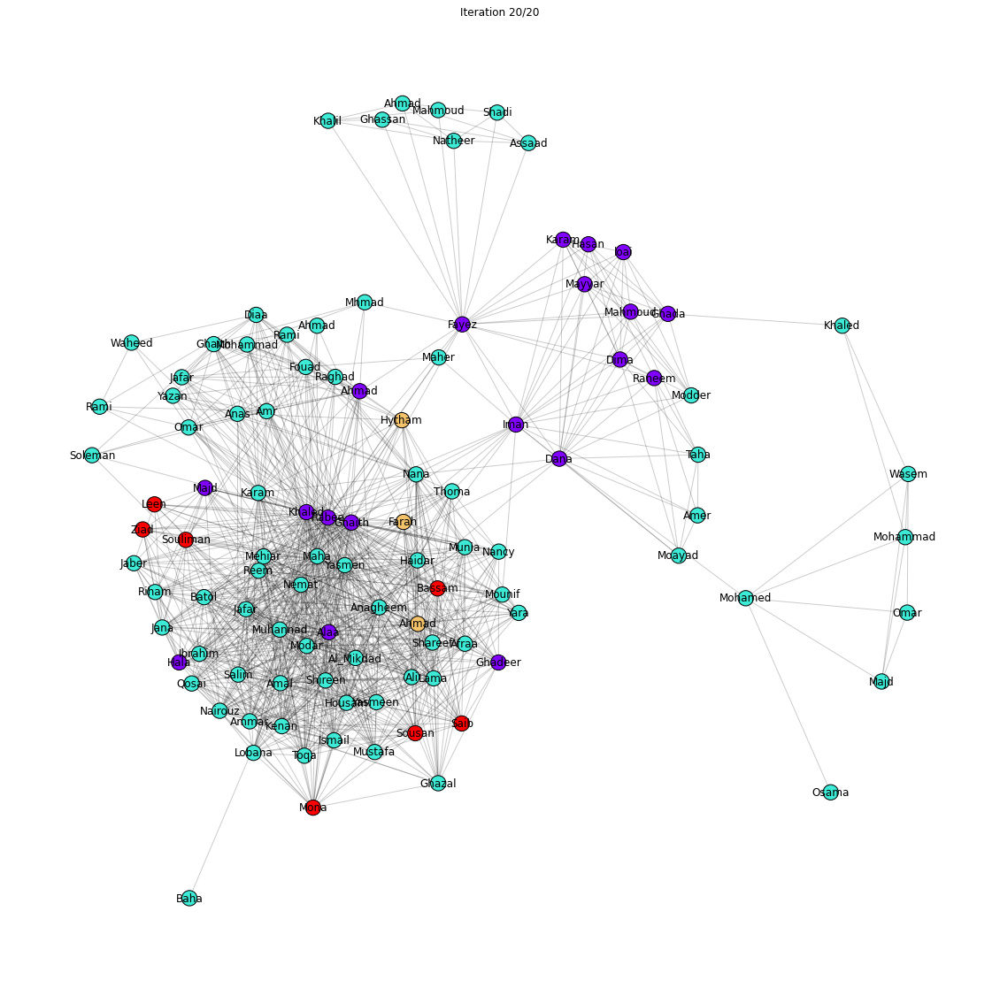

[  2.   2.   2.   2.   2.   2.   2.   2.   2.   2.   2.   2.   2.   2.
   2.  38.  38.  38.  38.  38.  38.  38.  38.  38.  38.  38.  38.  38.
  38.  38.  38.  38.  38.  38.  38.  38.  38.  38.  38.  38.  38.  38.
  38.  38.  38.  38.  38.  38.  38.  38.  38.  38.  38.  38.  38.  38.
  38.  38.  38.  38.  38.  38.  38.  38.  38.  38.  38.  38.  38.  38.
  38.  38.  38.  38.  38.  38.  38.  38.  38.  38.  38.  38.  38.  38.
  73.   2.  73.   2.   2.  73.   2. 100. 100. 100. 100. 100. 100. 100.
  38.  38.  38.  38.  38.  38.  38.  38.]


In [425]:
plot_propagation(G, sync_update_labels, 20)

In [422]:
def async_update_labels(graph, labels):
    sequential_order = np.arange(start=0, stop=len(graph.nodes), step=1)
    np.random.shuffle(sequential_order)
    uniquevalues = set(labels.tolist())
    new_labels = np.copy(labels)
    frequency = {}
    for index in range(0,len(sequential_order)):  
      for value in uniquevalues:
        frequency[value] = 0    
      for ne in graph.neighbors(sequential_order[index]):
        frequency[new_labels[ne]] = frequency[new_labels[ne]] + 1
      itemMaxValue = max(frequency.items(), key=operator.itemgetter(1))
      listOfKeys = list()
    # Iterate over all the items in dictionary to find keys with max value
      for key, value in frequency.items():
        if value == itemMaxValue[1]:
          listOfKeys.append(key)
      new_labels[sequential_order[index]] = random.choice(listOfKeys)
      #labels[sequential_order[index]] = random.choice(listOfKeys)
    #print(max(frequency.items(), key=lambda x: x[1])[0])
    return new_labels
    #return labels
    # YOUR CODE HERE
    #raise NotImplementedError()

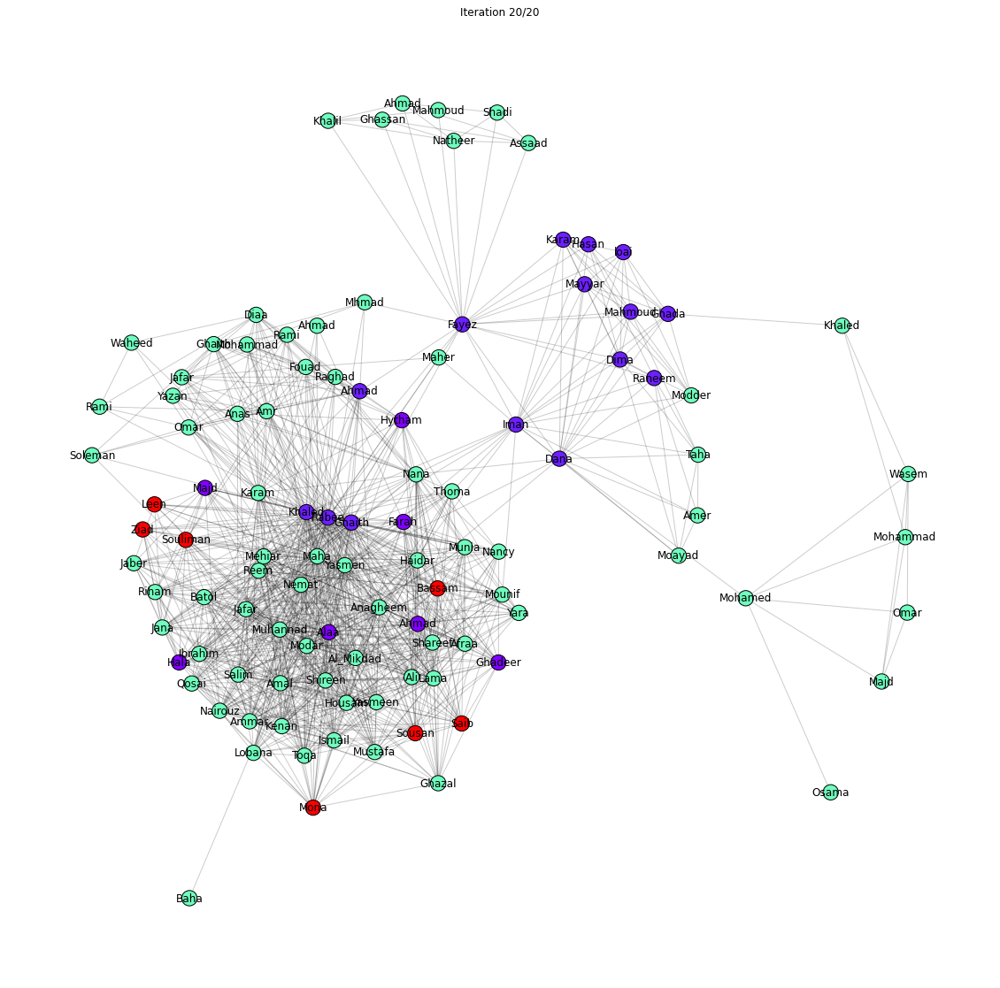

[  4   4   4   4   4   4   4   4   4   4   4   4   4   4   4  47  47  47
  47  47  47  47  47  47  47  47  47  47  47  47  47  47  47  47  47  47
  47  47  47  47  47  47  47  47  47  47  47  47  47  47  47  47  47  47
  47  47  47  47  47  47  47  47  47  47  47  47  47  47  47  47  47  47
  47  47  47  47  47  47  47  47  47  47  47  47   0   0   0   0   0   0
   0 101 101 101 101 101 101 101  47  47  47  47  47  47  47  47]


In [426]:
plot_propagation(G, async_update_labels, 20)

label propogation does not yield a good clustering (logical clustering) since it is very simple in the concept (assigning labels based on neighbors) which is not applicable in the case of complex structure such as our network at hand